In [43]:
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw

from mrcnn.visualize import display_instances, display_top_masks
from mrcnn.utils import extract_bboxes

from mrcnn.utils import Dataset
from matplotlib import pyplot as plt

from mrcnn.config import Config
from mrcnn.model import MaskRCNN


from mrcnn import model as modellib, utils
from PIL import Image, ImageDraw
import math
from mrcnn.model import load_image_gt
from mrcnn.model import mold_image
from mrcnn.utils import compute_ap
from numpy import expand_dims
from numpy import mean
from matplotlib.patches import Rectangle
import glob
from skimage.measure import find_contours
import itertools
import time

In [44]:
class_names = ['BG', 'line-0.5mm','circle-0.5mm','line-1.5mm','circle-1.5mm','line-2.5mm','circle-2.5mm']



In [45]:
class PredictionConfig(Config):
	# define the name of the configuration
	NAME = "marble_cfg_coco"
	# number of classes (background + Blue Marbles + Non Blue marbles)
	NUM_CLASSES = len(class_names)
	# Set batch size to 1 since we'll be running inference on
            # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
	GPU_COUNT = 1
	IMAGES_PER_GPU = 1


In [46]:
cfg = PredictionConfig()
# define the model
model = MaskRCNN(mode='inference', model_dir=os.getcwd(), config=cfg)
# load model weights
model.load_weights(filepath='mask_rcnn_marble_cfg_coco_1499.h5', by_name=True)



In [47]:

file_name = 'circle_2p5'
image_path = glob.glob('D:/PycharmProjects/Hiddencrack/tf-keras-frcnn/random_cropped_15_lang/images/'+ str(file_name)+str('/')+'*.npy')

# print(len(image_path))
result_path = 'D:/mask_rcnn_tutorial/Mask_RCNN_TF2_master/kangaroo_transfer_learning/result/'

Elapsed time = 2.4097354412078857

*** No instances to display *** 

Elapsed time = 0.22492766380310059
Elapsed time = 0.2710249423980713

*** No instances to display *** 

Elapsed time = 0.23192572593688965

*** No instances to display *** 

Elapsed time = 0.23787903785705566

*** No instances to display *** 

Elapsed time = 0.22794437408447266

*** No instances to display *** 

Elapsed time = 0.23392701148986816

*** No instances to display *** 

Elapsed time = 0.23392558097839355

*** No instances to display *** 

Elapsed time = 0.23655366897583008

*** No instances to display *** 

Elapsed time = 0.22792267799377441

*** No instances to display *** 

Elapsed time = 0.23092436790466309

*** No instances to display *** 

Elapsed time = 0.2389240264892578

*** No instances to display *** 

Elapsed time = 0.2449197769165039
Elapsed time = 0.26813244819641113

*** No instances to display *** 

Elapsed time = 0.24019861221313477
Elapsed time = 0.26391053199768066
Elapsed time = 0.2629153

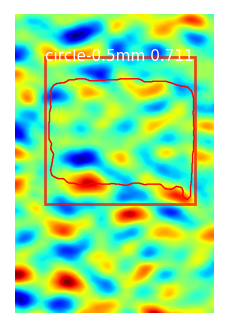

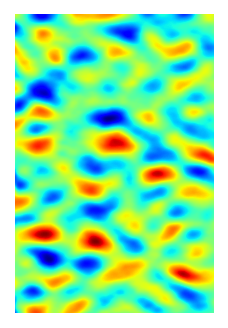

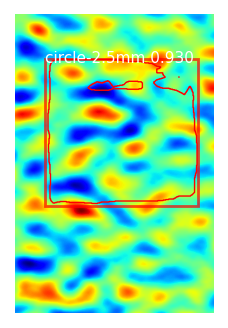

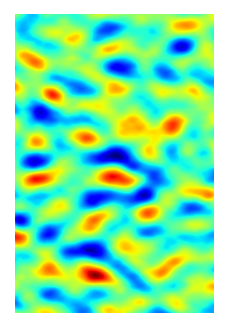

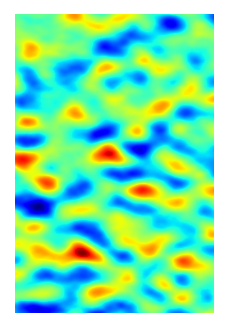

...

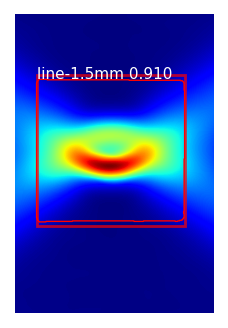

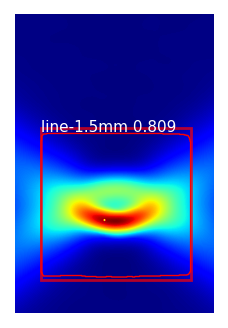

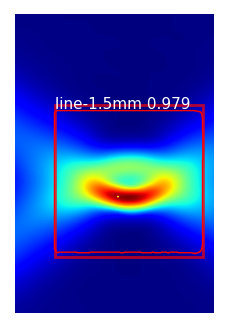

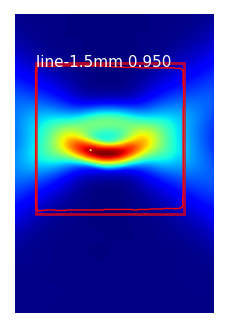

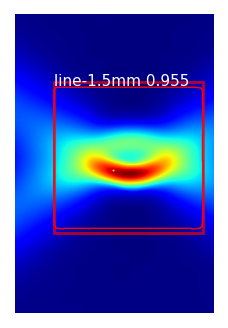

In [48]:
all_data=[]

for i in range(len(image_path)):
    st = time.time()
    image = np.load(image_path[i])
    image [:, :, 0] = 2 * (image [:, :, 0] - np.amin(image [:, :, 0])) / (np.amax(image[:, :, 0]) - np.amin(image [:, :, 0])) - 1
    image [:, :, 1] = 2 * (image [:, :, 1] - np.amin(image [:, :, 1])) / (np.amax(image[:, :, 1]) - np.amin(image [:, :, 1])) - 1
    image [:, :, 2] = 2 * (image [:, :, 2] - np.amin(image [:, :, 2])) / (np.amax(image [:, :, 2]) - np.amin(image [:, :, 2])) - 1

    # Perform a forward pass of the network to obtain the results
    r = model.detect([image])
    # print(f'Elapsed time = {time.time() - st}')
    # print(np.shape(r))
    # Get the results for the first image.
    r = r[0]




    boxes = r['rois']

    # image_name = image_path[i].split("/")[-1]
    image_name = os.path.basename(image_path[i]).split('.')[0]
    # print(image_name)
    image_data = []
    # result_path = result_path +str(image_name)+'.png'

    for k in range(boxes.shape[0]):

        class_id = r['class_ids'][k]
        label = class_names[class_id]
        bbox = boxes[k]
        cofi_score = r['scores'][k]
        # print(bbox)
        masks = r['masks']
        mask = masks[:, :, k]
        padded_mask = np.zeros(
            (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
        padded_mask[1:-1, 1:-1] = mask
        contours = find_contours(padded_mask, 0.5)

        # display_instances(image=image,boxes=bbox,masks=masks, class_ids=class_id, class_names=class_names,scores=cofi_score,show_mask=False,save_fig_path=result_path)


        for verts in contours:
            verts = np.fliplr(verts) - 1
            list_co_ordinates = np.moveaxis(verts, 1, 0).tolist()

            region = {"shape_attributes": {"all_points_x": list(map(int,list_co_ordinates[0])),
                                           "all_points_y": list(map(int,list_co_ordinates[1]))},
                      "bbox":list(map(int,bbox)),
                      "region_attributes": {"name": label},
                      "scores":float(cofi_score)}
            image_data.append(region)
    data = {"filename": image_name, "regions": image_data}
    all_data.append(data)
    display_instances(image=image,
                              boxes=r['rois'],
                              masks=r['masks'],
                              class_ids=r['class_ids'],
                              class_names=class_names,
                              scores=r['scores'], figsize=(4,4),
              show_mask=False,save_fig_path=result_path +str(image_name)+'.png')

    print(f'Elapsed time = {time.time() - st}')


annotaion_json = json.dumps(all_data,indent=4)

with open(file_name,"w") as outfile:
    outfile.write(annotaion_json)
# print(r['rois'])
# print(r['masks'])
# print(r['class_ids'])
# print(r['scores'])
# # Visualize the detected objects.
# plt.imshow(image[:,:,0],cmap='jet')
# display_instances(image=image,
#                                   boxes=r['rois'],
#                                   masks=r['masks'],
#                                   class_ids=r['class_ids'],
#                                   class_names=class_names,
#                                   scores=r['scores'],
#                   show_mask=False)


In [49]:

print(all_data[9]['regions'][0]['shape_attributes']['all_points_x'])

print(all_data[9]['regions'][0]['bbox'])

print(all_data[9]['regions'][0]['region_attributes']['name'])
print(all_data[9]['regions'][0]['scores'])




# from skimage.measure import find_contours
# import numpy as np
#
#
# def save_co_ordinates(image, boxes, masks, class_ids, class_names,scores):
#
#     for j in len(image_path):
#     image = image_path.split("/")[-1]
#     image_data = []
#     print(boxes.shape)
#     for i in range(boxes.shape[0]):
#
#         class_id = class_ids[i]
#         label = class_names[class_id]
#         bbox = boxes[i]
#         cofi_score = scores
#         print(bbox)
#
#         mask = masks[:, :, i]
#         padded_mask = np.zeros(
#             (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
#         padded_mask[1:-1, 1:-1] = mask
#         contours = find_contours(padded_mask, 0.5)
#         for verts in contours:
#             verts = np.fliplr(verts) - 1
#             list_co_ordinates = np.moveaxis(verts, 1, 0).tolist()
#
#             region = {"shape_attributes": {"all_points_x": list_co_ordinates[0],
#                                            "all_points_y": list_co_ordinates[1]},
#                       "bbox":list(bbox),
#                       "region_attributes": {"name": {label: True}},
#                       "scores":list(cofi_score)}
#             image_data.append(region)
#     data = {"filename": image, "regions": image_data}
#     return data
#
# print(save_co_ordinates(image_path, r['rois'], r['masks'], r['class_ids'], class_names,r['scores']))

IndexError: list index out of range